In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from brain_image.utils import setup_logging


setup_logging()

In [3]:
from pathlib import Path
from brain_image.model.eeg_alignment import EEGAlignmentModel


checkpoint_path = Path("checkpoints/prior/checkpoints/train_eeg-epoch_431-val-loss_1.0122.ckpt")
model = EEGAlignmentModel.load_from_checkpoint(checkpoint_path)
model.eval()



00:55:01 | INFO     | Resolving workspace directory, traversing up from starting from /home/gasparyanartur/dev/brain-image-implementation/src/brain_image/configs.py
00:55:01 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation/src/brain_image
00:55:01 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation/src
00:55:01 | INFO     | Current directory: /home/gasparyanartur/dev/brain-image-implementation
00:55:01 | INFO     | Found pyproject.toml
00:55:04 | INFO     | Getting embedding stats for ['clip_vith14'] - 16540 images
00:55:16 | INFO     | Keys gathered: dict_keys(['clip_vith14'])
00:55:16 | INFO     | Finished getting embeddings dict_keys(['clip_vith14'])
00:55:16 | INFO     | Finished getting embedding stats
00:55:16 | INFO     | Embeddings stats:
00:55:16 | INFO     | 	prior_img_latent: <class 'dict'>
00:55:16 | INFO     | 	prior_img_latent.mean: tensor([-0.0020,  0.0969,  0.0407,  ..., -0.0857, -0.0866,  0.2875])
00:55

EEGAlignmentModel(
  (loss): CrossEntropyLoss()
  (prior): SimpleDiffusionPrior(
    (time_proj): Timesteps()
    (input_proj): Sequential(
      (0): Linear(in_features=1024, out_features=1024, bias=True)
      (1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
      (2): SiLU()
    )
    (time_encoders): ModuleList(
      (0): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=1024, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=1024, out_features=1024, bias=True)
      )
      (1): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=512, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=512, out_features=512, bias=True)
      )
      (2): TimestepEmbedding(
        (linear_1): Linear(in_features=512, out_features=256, bias=True)
        (act): SiLU()
        (linear_2): Linear(in_features=256, out_features=256, bias=True)
      )
      (3): TimestepEmbedding(
        (linear_1): 

In [4]:
dl = model.test_dataloader()
ex_batch = next(iter(dl))


00:55:17 | INFO     | Loading test dataset
00:55:17 | INFO     | Loaded 200 samples
00:55:17 | INFO     | Preloading latents in parallel with 16 workers
00:55:17 | INFO     | Preloaded 200 latents


In [5]:
import torch
device, dtype = model._get_device_dtype()
with torch.no_grad():
    eeg_latent, eeg_latent_normed = model.get_eeg_latent(ex_batch, device, dtype)



In [6]:
model.data_module.embedding_stats

{'prior_img_latent': {'mean': tensor([-0.0020,  0.0969,  0.0407,  ..., -0.0857, -0.0866,  0.2875]),
  'std': tensor([0.4657, 0.4816, 0.4836,  ..., 0.4944, 0.4910, 0.4939]),
  'min': tensor([-1.5325, -2.0225, -1.5808,  ..., -1.8227, -2.0034, -1.7975]),
  'max': tensor([1.8429, 1.9183, 1.7952,  ..., 1.6703, 1.7763, 2.2460]),
  'norm': tensor(22.1930)}}

In [7]:
model.prior.config.norm_scheme = "z_scale"
prior_pred = model.get_all_prior_preds(eeg_latent_normed)

Prior sampling: 100%|██████████| 200/200 [00:00<00:00, 464.42it/s]


In [8]:
target_latent = ex_batch["prior_img_latent"]

In [9]:
import torch
import torch.nn.functional as F


with torch.no_grad():
    #conditioning = torch.cat(
    #    [F.normalize(prior_pred), F.normalize(target_latent)], dim=0
    #)
    conditioning = F.normalize(prior_pred)

recon_pred = model.get_prior_reconstructions(
    conditioning, pipe_kwargs={"progress_bar": True}
)

#recon_pred, recon_target = recon.chunk(2)

Keyword arguments {'device': device(type='cuda', index=0)} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Reconstructing latents: 100%|██████████| 200/200 [01:43<00:00,  1.94it/s]


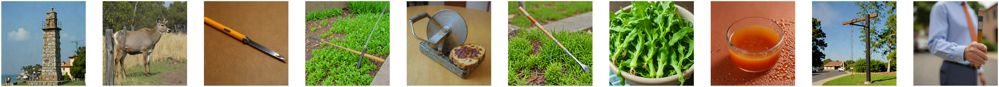

In [10]:
from brain_image.utils import show_image


show_image(recon_pred[:10])

00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..249.0].
00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..221.0].
00:57:21 | WARNING  | Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
00:57:21 | WARNING  | Clipping input data to the valid range for

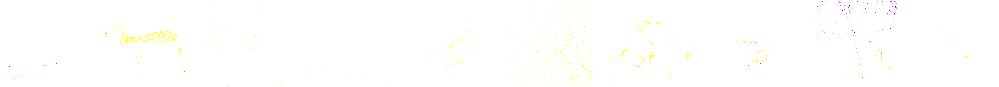

In [11]:
from brain_image.data import batch_load_images


img_paths = ex_batch["img_path"]
gts = batch_load_images(img_paths)
show_image(gts[:10])

In [12]:
from brain_image.model.img_encoder import load_image_encoder


img_enc = load_image_encoder("clip_vith14")
gts_pp = img_enc.preprocess(gts)
gts_pp.shape

torch.Size([200, 3, 224, 224])

In [13]:
from brain_image.reconstruction import IPAdapterReconstructionPipeline


pipe = IPAdapterReconstructionPipeline.load_pretrained()

Keyword arguments {'device': device(type='cuda')} are not expected by StableDiffusionXLPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [14]:
recon_pred.min(), recon_pred.max(), recon_pred.shape

(tensor(0., device='cuda:0'),
 tensor(1., device='cuda:0'),
 torch.Size([200, 3, 512, 512]))

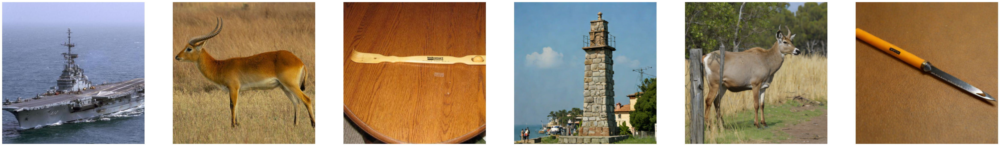

In [15]:
import torchvision.transforms.v2 as tv2
resize_pipe = tv2.Compose([
    tv2.Resize(425, tv2.InterpolationMode.BILINEAR),
    tv2.ToDtype(torch.float, scale=True),
])

gtsp = resize_pipe(gts)
recon_pred = resize_pipe(recon_pred)
show_image(gtsp[:3], recon_pred[:3])

In [16]:
import numpy as np

@torch.no_grad()
def get_metric_pixcorr(pred: torch.Tensor, gt: torch.Tensor) -> torch.Tensor:
    processor = tv2.Compose([
        tv2.Resize(425, tv2.InterpolationMode.BILINEAR),
        tv2.ToDtype(torch.float, scale=True),
    ])

    assert len(pred) == len(gt)
    B = pred.size(0)
    
    pred = pred.cpu()
    pred = processor(pred)
    pred = pred.reshape(B, -1)

    gt = gt.cpu()
    gt = processor(gt)
    gt = gt.reshape(B, -1)

    all_corrs = np.stack([np.corrcoef(torch.stack((pred[i].double(), gt[i].double())))[0, 1] for i in range(B)])
    return torch.from_numpy(all_corrs).mean().float()

pixcorr =  get_metric_pixcorr(recon_pred.cpu(), gtsp.cpu())
pixcorr

tensor(0.1554)

In [17]:
@torch.no_grad()
def get_metric_ssim(pred: torch.Tensor, gt: torch.Tensor):
    from skimage.color import rgb2gray
    from skimage.metrics import structural_similarity as ssim

    processor = tv2.Compose([
        tv2.Resize(425, tv2.InterpolationMode.BILINEAR),
        tv2.ToDtype(torch.float, scale=True),
    ])

    assert len(pred) == len(gt)
    B = gt.shape[0]

    pred = pred.cpu()
    pred = processor(pred)
    pred = pred.permute(0, 2, 3, 1)
    pred = rgb2gray(pred)

    gt = gt.cpu()
    gt = processor(gt)
    gt = gt.permute(0, 2, 3, 1)
    gt = rgb2gray(gt)

    all_ssims = np.stack([ssim(gt[i], pred[i], multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=1.0) for i in range(B)])
    return torch.from_numpy(all_ssims).mean().float()

ssim =  get_metric_ssim(recon_pred, gtsp)
ssim

tensor(0.3031)

In [18]:
from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names

@torch.no_grad()
def two_way_identification(pred, gt, model, feature_layer=None) -> np.ndarray:
    pred_f = model(pred)
    gt_f = model(gt)
    B = pred.size(0)

    if feature_layer is not None:
        pred_f = pred_f[feature_layer]
        gt_f = gt_f[feature_layer]

    pred_f = pred_f.flatten(1).cpu()
    gt_f = gt_f.flatten(1).cpu()

    r = np.corrcoef(pred_f, gt_f)
    r = r[:B, B:]
    congruents = np.diag(r)

    success = r < congruents
    success_cnt = np.sum(success, 0)

    perf = np.mean(success_cnt) / (B-1)
    return perf


In [19]:
from typing import Literal


@torch.no_grad()
def get_metric_alex_score(pred, gt, feature: Literal["alexnet2", "alexnet5"]):
    from torchvision.models import alexnet, AlexNet_Weights

    device = pred.device
    gt = gt.to(device)

    weights = AlexNet_Weights.IMAGENET1K_V1

    model = create_feature_extractor(
        alexnet(weights=weights), return_nodes=["features.4", "features.11"]
    ).to(device)
    model.eval().requires_grad_(False)

    feature_to_feature_layer = {
        "alexnet2": "features.4",
        "alexnet5": "features.11"
    }

    feature_layer = feature_to_feature_layer[feature]

    processor = tv2.Compose(
        [
            tv2.Resize(256, interpolation=tv2.InterpolationMode.BILINEAR),
            tv2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    )

    pred = processor(pred)
    gt = processor(gt)

    score = two_way_identification(pred, gt, model, feature_layer=feature_layer)
    return torch.tensor(score).float()

alex2 = get_metric_alex_score(recon_pred, gtsp, "alexnet2")
alex5 = get_metric_alex_score(recon_pred, gtsp, "alexnet5")
alex2, alex5

(tensor(0.8244), tensor(0.8803))

In [20]:
@torch.no_grad()
def get_metric_inceptionv3_score(pred, gt):
    from torchvision.models import inception_v3, Inception_V3_Weights

    device = pred.device
    gt = gt.to(device)

    weights = Inception_V3_Weights.DEFAULT
    model = create_feature_extractor(
        inception_v3(weights=weights), return_nodes=["avgpool"]
    ).to(device)
    model.eval().requires_grad_(False)

    feature_layer = "avgpool"

    processor = tv2.Compose(
        [
            tv2.Resize(342, interpolation=tv2.InterpolationMode.BILINEAR),
            tv2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    )

    pred = processor(pred)
    gt = processor(gt)

    score = two_way_identification(pred, gt, model, feature_layer=feature_layer)
    return torch.tensor(score).float()

inception = get_metric_inceptionv3_score(recon_pred, gtsp)
inception

/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/feature_extraction.py:175: UserWarning: NOTE: The nodes obtained by tracing the model in eval mode are a subsequence of those obtained in train mode. When choosing nodes for feature extraction, you may need to specify output nodes for train and eval mode separately.
  warnings.warn(msg + suggestion_msg)


tensor(0.7644)

In [21]:
@torch.no_grad()
def get_metric_clip(pred, gt):
    import clip

    device = pred.device
    gt = gt.to(device)

    clip_model, _ = clip.load("ViT-L/14", device=device)
    clip_model.eval().requires_grad_(False)
    model = clip_model.encode_image

    process = tv2.Compose([
        tv2.Resize(224, interpolation=tv2.InterpolationMode.BILINEAR),
        tv2.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                            std=[0.26862954, 0.26130258, 0.27577711]),
    ])

    pred = process(pred)
    gt = process(gt)

    score = two_way_identification(pred, gt, model, feature_layer=None) 
    return torch.tensor(score).float()

clip = get_metric_clip(recon_pred, gtsp)
clip


/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/clip/clip.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging


tensor(0.8222)

In [22]:
@torch.no_grad()
def get_metric_efficientnet(pred, gt):
    from torchvision.models import efficientnet_b1, EfficientNet_B1_Weights
    import scipy

    device = pred.device
    gt = gt.to(device)

    weights = EfficientNet_B1_Weights.DEFAULT
    model = create_feature_extractor(efficientnet_b1(weights=weights), 
                                        return_nodes=['avgpool']).to(device)
    model.eval().requires_grad_(False)

    processor = tv2.Compose([
        tv2.Resize(255, interpolation=tv2.InterpolationMode.BILINEAR),
        tv2.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225]),
    ])

    B = pred.size(0)

    pred = processor(pred)
    pred = model(pred)["avgpool"].reshape(B, -1)
    pred = pred.cpu().numpy()

    gt = processor(gt)
    gt = model(gt)["avgpool"].reshape(B, -1)
    gt = gt.cpu().numpy()

    score = np.array([scipy.spatial.distance.correlation(gt[i], pred[i]) for i in range(B)]).mean()
    return torch.tensor(score).float()

eff = get_metric_efficientnet(recon_pred, gtsp)
eff

tensor(0.8571)

In [ ]:
@torch.no_grad()
def get_metric_swav(pred, gt):
    import scipy
    import sys
    import os
    from torchvision.models.resnet import resnet50 as _resnet50

    def load_swav_resnet50():
        # Using torch.hub.load is broken on the swav repo, so we load the weights manually
        # From https://github.com/facebookresearch/swav/blob/main/hubconf.py
        swav_model = _resnet50(pretrained=False)
        state_dict = torch.hub.load_state_dict_from_url(
            url="https://dl.fbaipublicfiles.com/deepcluster/swav_800ep_pretrain.pth.tar",
            map_location="cpu",
        )
        state_dict = {k.replace("module.", ""): v for k, v in state_dict.items()}
        swav_model.load_state_dict(state_dict, strict=False)
        return swav_model

    device = pred.device
    gt = gt.to(device)

    swav_model = load_swav_resnet50()
    model = create_feature_extractor(swav_model, return_nodes=["avgpool"]).to(device)
    model.eval().requires_grad_(False)

    processor = tv2.Compose(
        [
            tv2.Resize(224, interpolation=tv2.InterpolationMode.BILINEAR),
            tv2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    )

    B = pred.size(0)

    pred = processor(pred)
    pred = model(pred)["avgpool"].reshape(B, -1)
    pred = pred.cpu().numpy()

    gt = processor(gt)
    gt = model(gt)["avgpool"].reshape(B, -1)
    gt = gt.cpu().numpy()

    score = np.array([scipy.spatial.distance.correlation(gt[i], pred[i]) for i in range(B)]).mean()
    return torch.tensor(score).float()


swav = get_metric_swav(recon_pred, gtsp)
swav

/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/gasparyanartur/dev/brain-image-implementation/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Downloading: "https://dl.fbaipublicfiles.com/deepcluster/swav_800ep_pretrain.pth.tar" to /home/gasparyanartur/.cache/torch/hub/checkpoints/swav_800ep_pretrain.pth.tar


100%|██████████| 108M/108M [00:04<00:00, 23.6MB/s] 


tensor(0.5377)